<a href="https://colab.research.google.com/github/VedantDere0104/GANs/blob/main/Pix2Pix_Torch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
####

In [2]:

import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import VOCSegmentation
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)
import numpy as np

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
  image_shifted = image_tensor
  image_unflat = image_shifted.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1, 2, 0).squeeze())
  plt.show()

In [3]:
def crop(image, new_shape):
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - new_shape[2] // 2
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - new_shape[3] // 2
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

In [4]:
class Block(nn.Module):
  def __init__(self , input_channels , use_dropout = False , use_batch_norm = True):
    super(Block , self).__init__()
    self.input_channels = input_channels
    self.use_dropout = use_dropout
    self.use_batch_norm = use_batch_norm

    self.conv1 = nn.Conv2d(input_channels , input_channels * 2 , kernel_size=3 , padding=1)
    self.conv2 = nn.Conv2d(input_channels * 2 , input_channels * 2 , kernel_size=3 , padding=1)
    self.activation = nn.LeakyReLU(0.2)
    self.maxpool = nn.MaxPool2d(kernel_size=2 , stride=2)
    if self.use_batch_norm:
      self.batch_norm = nn.BatchNorm2d(input_channels * 2)
    if self.use_dropout:
      self.dropout = nn.Dropout()
    
  def forward(self , x):
    x = self.conv1(x)
    if self.use_batch_norm:
      x = self.batch_norm(x)
    if self.use_dropout:
      x = self.dropout(x)
    x = self.activation(x)
    x = self.conv2(x)
    if self.use_batch_norm:
      x = self.batch_norm(x)
    if self.use_dropout:
      x = self.dropout(x)
    x = self.activation(x)
    x = self.maxpool(x)
    return x

In [5]:
class Expanding_block(nn.Module):
  def __init__(self , input_channels , use_dropout = False , use_batch_norm = True):
    super(Expanding_block , self).__init__()
    self.input_channels = input_channels
    self.use_batch_norm = use_batch_norm
    self.use_dropout = use_dropout
    self.use_batch_norm = use_batch_norm
    self.upsample = nn.Upsample(scale_factor=2 , mode = 'bilinear' , align_corners=True)
    self.conv1 = nn.Conv2d(input_channels , input_channels //2 , kernel_size=2)
    self.conv2 = nn.Conv2d(input_channels , input_channels //2 , kernel_size=3 , padding=1)
    self.conv3 = nn.Conv2d(input_channels//2 , input_channels //2 , kernel_size=2 , padding = 1)
    if self.use_batch_norm:
      self.batch_norm = nn.BatchNorm2d(input_channels // 2)
    if self.use_dropout:
      self.dropout = nn.Dropout()
    self.activation = nn.ReLU(0.2)
    
  def forward(self , x , skip_con_x):
    x = self.upsample(x)
    x = self.conv1(x)
    skip_con_x = crop(skip_con_x , x.shape)
    x = torch.cat([x , skip_con_x] , axis = 1)
    x = self.conv2(x)
    if self.use_batch_norm:
      x = self.batch_norm(x)
    if self.use_dropout:
      x = self.dropout(x)
    x = self.activation(x)
    x = self.conv3(x)
    if self.use_batch_norm:
      x = self.batch_norm(x)
    if self.use_dropout:
      x = self.dropout(x)
    x = self.activation(x)
    return x

In [6]:
class Featuremap_block(nn.Module):
  def __init__(self , input_channels , output_channels):
    super(Featuremap_block , self).__init__()
    self.conv = nn.Conv2d(input_channels , output_channels , kernel_size=1)
  def forward(self , x):
    x = self.conv(x)
    return x

In [7]:

class UNET(nn.Module):
  def __init__(self , input_channels , output_channels , hidden_channels = 32):
    super(UNET , self).__init__()
    self.upfeature = Featuremap_block(input_channels , hidden_channels)
    self.block_1 = Block(hidden_channels  , use_dropout= True)
    self.block_2 = Block(hidden_channels * 2 , use_dropout= True)
    self.block_3 = Block(hidden_channels * 4 , use_dropout=True)
    self.block_4 = Block(hidden_channels * 8)
    self.block_5 = Block(hidden_channels * 16)
    self.block_6 = Block(hidden_channels * 32)
    self.expand_1 = Expanding_block(hidden_channels * 64)
    self.expand_2 = Expanding_block(hidden_channels * 32)
    self.expand_3 = Expanding_block(hidden_channels * 16)
    self.expand_4 = Expanding_block(hidden_channels * 8)
    self.expand_5 = Expanding_block(hidden_channels * 4)
    self.expand_6 = Expanding_block(hidden_channels * 2)
    self.downfeature = Featuremap_block(hidden_channels , output_channels)
    self.sigmoid = nn.Sigmoid()

  def forward(self , x):
    x0 = self.upfeature(x)
    x1 = self.block_1(x0)
    x2 = self.block_2(x1)
    x3 = self.block_3(x2)
    x4 = self.block_4(x3)
    x5 = self.block_5(x4)
    x6 = self.block_6(x5)
    x7 = self.expand_1(x6 , x5)
    x8 = self.expand_2(x7 , x4)
    x9 = self.expand_3(x8 , x3)
    x10 = self.expand_4(x9 , x2)
    x11 = self.expand_5(x10 , x1)
    x12 = self.expand_6(x11 , x0)
    xn = self.downfeature(x12)
    return self.sigmoid(xn)

In [8]:
class Discriminator(nn.Module):
  def __init__(self , input_channels , hidden_channels = 8):
    super(Discriminator , self).__init__()
    self.upfeature = Featuremap_block(input_channels , hidden_channels)
    self.block_1 = Block(hidden_channels , use_batch_norm=False)
    self.block_2 = Block(hidden_channels * 2)
    self.block_3 = Block(hidden_channels * 4)
    self.block_4 = Block(hidden_channels * 8)

    self.final = nn.Conv2d(hidden_channels * 16 , 1 , kernel_size=1)

  def forward(self , x , y):
    x = torch.cat([x , y] , axis = 1)
    x0 = self.upfeature(x)
    x1 = self.block_1(x0)
    x2 = self.block_2(x1)
    x3 = self.block_3(x2)
    x4 = self.block_4(x3)
    nx = self.final(x4)
    return nx



In [9]:
adv_criterion = nn.BCEWithLogitsLoss()
recon_criterion = nn.L1Loss()
lambda_recon = 200


n_epochs = 200
input_dim = 3
real_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda' if torch.cuda.is_available() else 'cpu'


In [10]:

transform = transforms.Compose([
    transforms.ToTensor(),
])

import torchvision
dataset = torchvision.datasets.ImageFolder("/content/drive/MyDrive/Maps/maps/", transform=transform)

In [11]:
gen = UNET(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

In [12]:
def get_gen_loss(gen , disc , real , condition , adv_criterion , recon_criterion , lambda_recon):
  fake = gen(condition)
  disc_fake_hat = disc(fake , condition)
  gen_adv_loss = adv_criterion(disc_fake_hat , torch.ones_like(disc_fake_hat))
  gen_rec_loss = recon_criterion(real , condition)
  gen_loss = gen_adv_loss + lambda_recon * gen_rec_loss
  return gen_loss


In [13]:
def train():
  mean_generator_loss = 0
  mean_discriminator_loss = 0
  dataloader = DataLoader(dataset , batch_size = batch_size , shuffle=True)
  cur_step = 0

  for epoch in range(n_epochs):
    for img , _ in tqdm(dataloader):
      image_width = img.shape[3]
      condition = img[: , : , : , :image_width//2]
      condition = nn.functional.interpolate(condition , size = target_shape)
      real = img[: , : , : , image_width//2:]
      real = nn.functional.interpolate(real , size = target_shape)
      cur_batch_size = len(condition)
      real = real.to(device)
      condition = condition.to(device)

      disc_opt.zero_grad()
      with torch.no_grad():
        fake = gen(condition)
      disc_fake_hat = disc(fake.detach() , condition)
      disc_fake_loss = adv_criterion(disc_fake_hat , torch.zeros_like(disc_fake_hat))
      
      disc_real_hat = disc(real , condition)
      disc_real_loss = adv_criterion(disc_real_hat , torch.ones_like(disc_real_hat))
      
      disc_loss = (disc_real_loss + disc_fake_loss)/2
      disc_loss.backward()
      disc_opt.step()

      gen_opt.zero_grad()
      gen_loss = get_gen_loss(gen , disc , real , condition , adv_criterion , recon_criterion , lambda_recon)
      gen_loss.backward()
      gen_opt.step()
      
      mean_discriminator_loss += disc_loss.item() / display_step
      mean_generator_loss += gen_loss.item() / display_step

      if cur_step % display_step == 0:
        if cur_step > 0:
          print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
        else:
          print("Pretrained initial state")
        show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
        show_tensor_images(real, size=(real_dim, target_shape, target_shape))
        show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
        mean_generator_loss = 0
        mean_discriminator_loss = 0
      cur_step += 1



Pretrained initial state


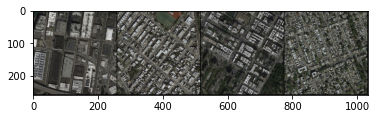

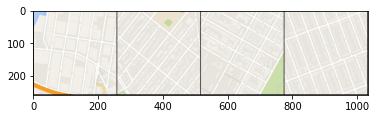

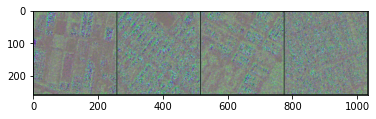

Epoch 0: Step 200: Generator (U-Net) loss: 127.09678886413569, Discriminator loss: 0.20410645067691807


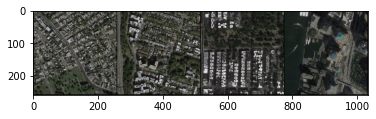

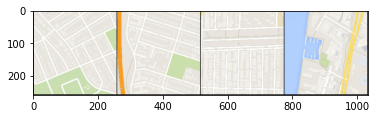

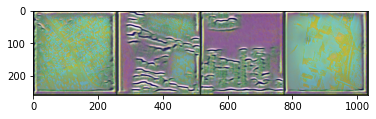

Epoch 0: Step 400: Generator (U-Net) loss: 129.06849613189695, Discriminator loss: 0.028147639711387458


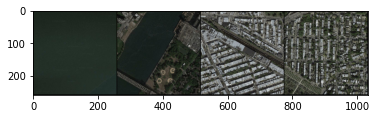

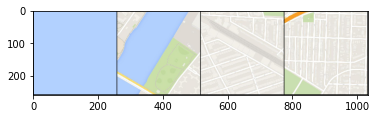

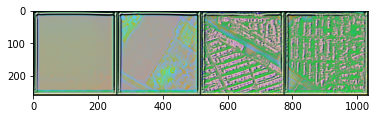

Epoch 1: Step 600: Generator (U-Net) loss: 129.68717258453373, Discriminator loss: 0.011993114762008194


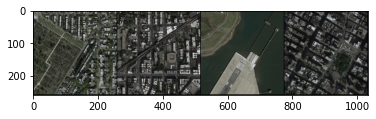

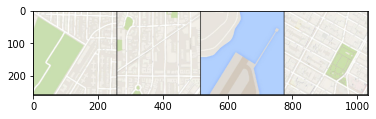

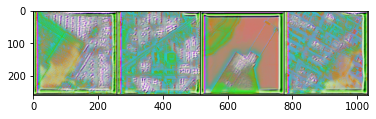

Epoch 1: Step 800: Generator (U-Net) loss: 128.12009403228765, Discriminator loss: 0.3218357475381345


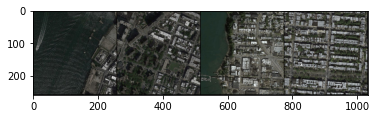

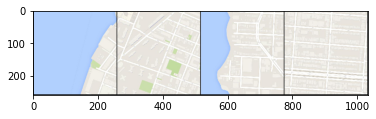

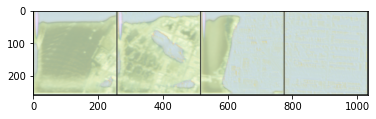

Epoch 1: Step 1000: Generator (U-Net) loss: 125.82774864196783, Discriminator loss: 0.6321073140203953


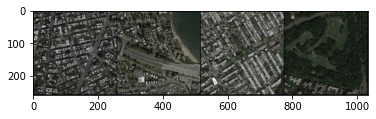

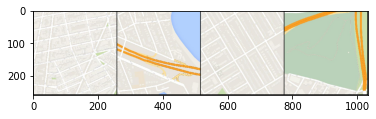

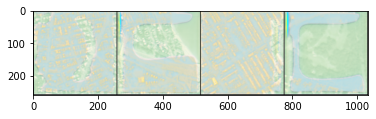

Epoch 2: Step 1200: Generator (U-Net) loss: 126.01646167755128, Discriminator loss: 0.6793899181485178


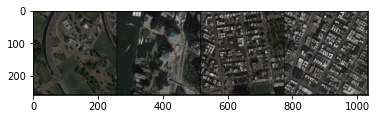

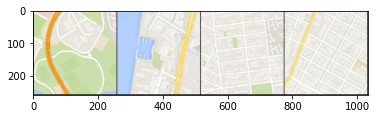

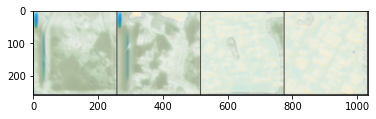

Epoch 2: Step 1400: Generator (U-Net) loss: 125.91750045776362, Discriminator loss: 0.6641276478767396


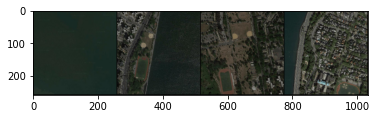

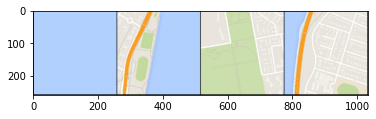

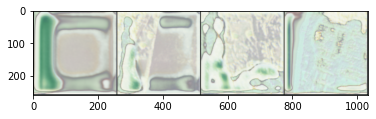

Epoch 2: Step 1600: Generator (U-Net) loss: 126.31130119323727, Discriminator loss: 0.6017832551896568


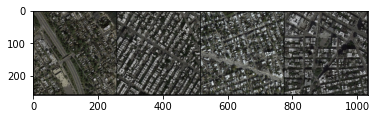

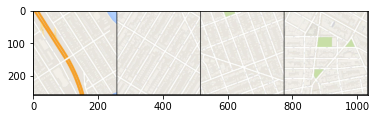

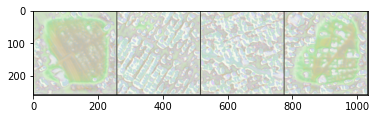

Epoch 3: Step 1800: Generator (U-Net) loss: 126.4992949676514, Discriminator loss: 0.5304686508327726


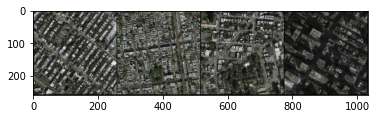

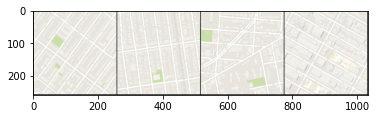

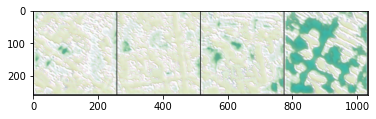

Epoch 3: Step 2000: Generator (U-Net) loss: 126.63003078460693, Discriminator loss: 0.45449089743196963


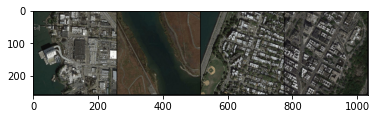

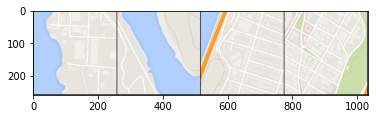

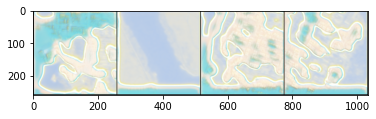

Epoch 4: Step 2200: Generator (U-Net) loss: 127.21088798522949, Discriminator loss: 0.2596086166054009


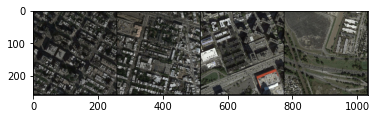

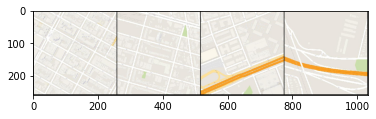

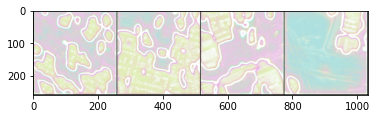

Epoch 4: Step 2400: Generator (U-Net) loss: 127.9008792877197, Discriminator loss: 0.1946041200868785


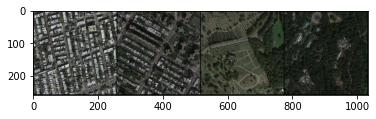

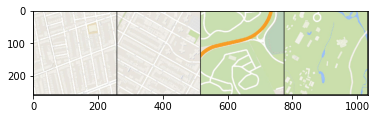

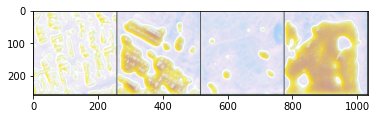

Epoch 4: Step 2600: Generator (U-Net) loss: 128.16490463256832, Discriminator loss: 0.20351312058046467


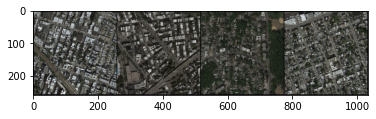

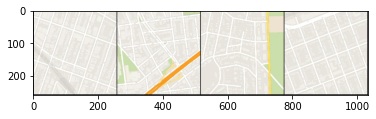

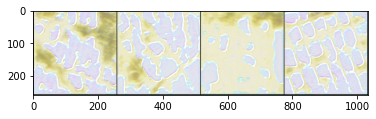

Epoch 5: Step 2800: Generator (U-Net) loss: 127.31233619689938, Discriminator loss: 0.33028426347300416


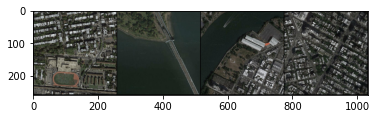

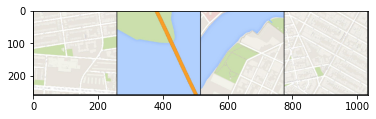

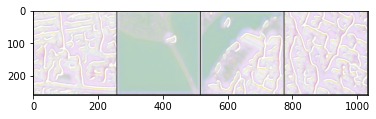

Epoch 5: Step 3000: Generator (U-Net) loss: 127.89259368896485, Discriminator loss: 0.3095891937427222


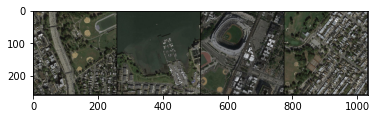

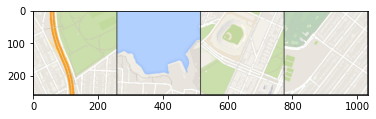

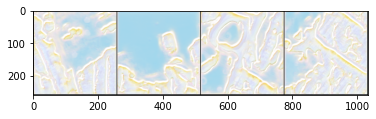

Epoch 5: Step 3200: Generator (U-Net) loss: 127.02310157775887, Discriminator loss: 0.3171152945421634


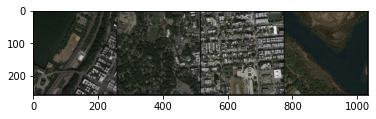

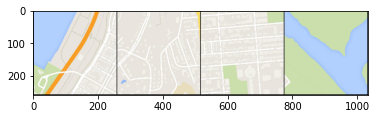

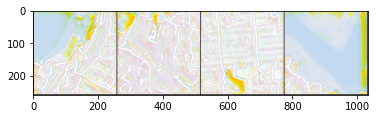

Epoch 6: Step 3400: Generator (U-Net) loss: 127.16853675842286, Discriminator loss: 0.3439767964929342


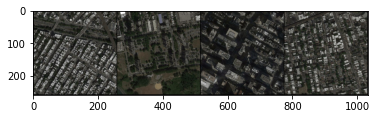

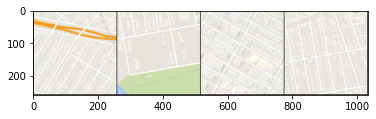

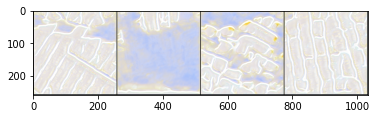

Epoch 6: Step 3600: Generator (U-Net) loss: 127.51193080902102, Discriminator loss: 0.296617452353239


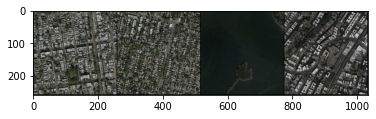

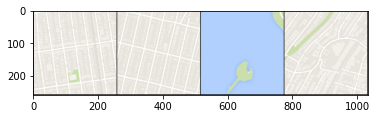

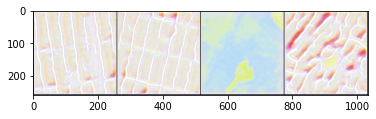

Epoch 6: Step 3800: Generator (U-Net) loss: 127.12148128509531, Discriminator loss: 0.2860179189965128


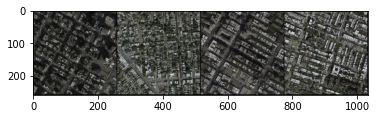

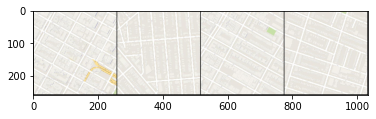

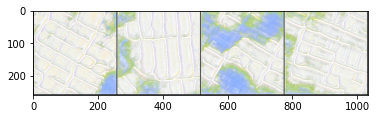

Epoch 7: Step 4000: Generator (U-Net) loss: 127.19996189117428, Discriminator loss: 0.35580893231555827


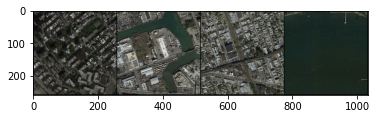

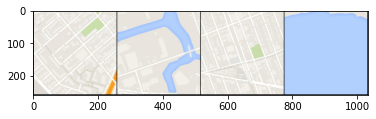

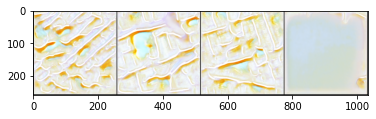

Epoch 7: Step 4200: Generator (U-Net) loss: 127.63914062500002, Discriminator loss: 0.3056613792106509


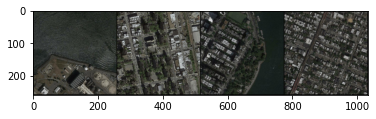

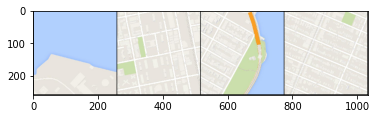

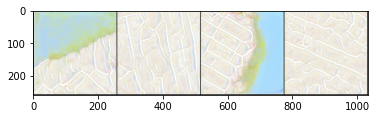

Epoch 8: Step 4400: Generator (U-Net) loss: 127.41880901336664, Discriminator loss: 0.30582821790128945


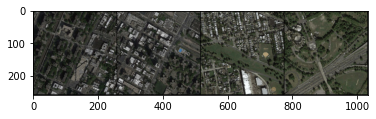

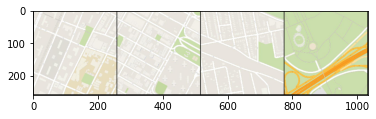

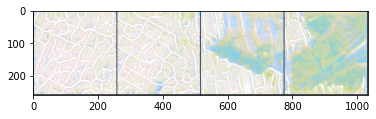

Epoch 8: Step 4600: Generator (U-Net) loss: 127.87012577056883, Discriminator loss: 0.3175851368531586


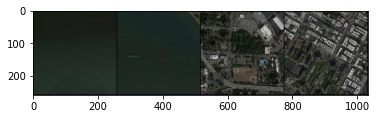

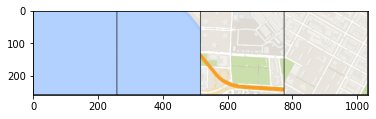

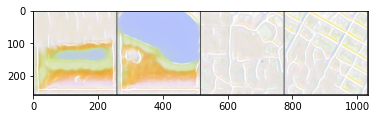

Epoch 8: Step 4800: Generator (U-Net) loss: 127.39030040740963, Discriminator loss: 0.31351395567879076


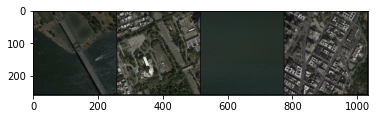

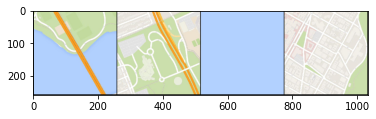

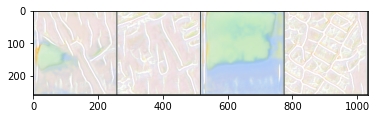

Epoch 9: Step 5000: Generator (U-Net) loss: 127.76578395843504, Discriminator loss: 0.2681045033596456


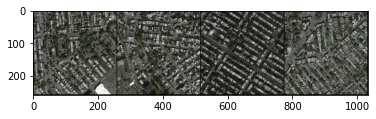

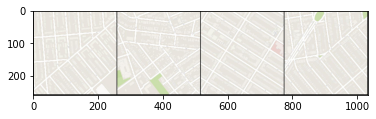

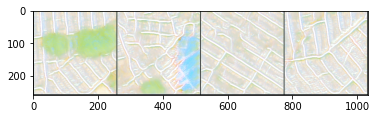

Epoch 9: Step 5200: Generator (U-Net) loss: 128.05242221832282, Discriminator loss: 0.19246914066374304


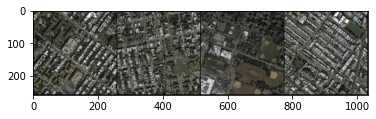

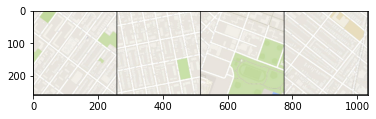

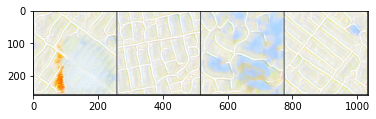

Epoch 9: Step 5400: Generator (U-Net) loss: 127.72181816101069, Discriminator loss: 0.3049021354969591


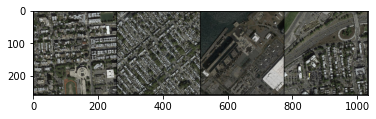

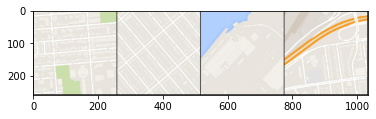

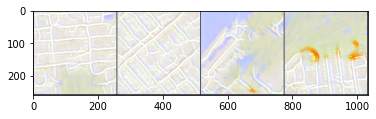

Epoch 10: Step 5600: Generator (U-Net) loss: 128.34092117309572, Discriminator loss: 0.18161390144377948


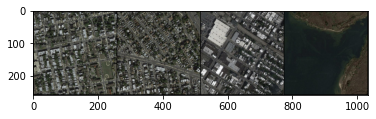

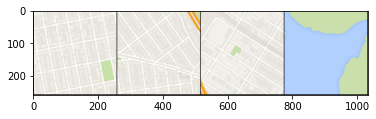

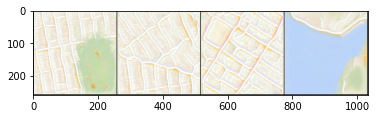

Epoch 10: Step 5800: Generator (U-Net) loss: 127.2837929916382, Discriminator loss: 0.33218801815062754


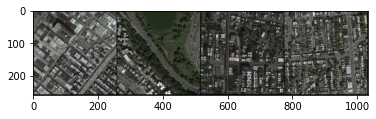

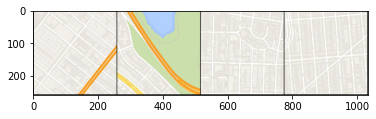

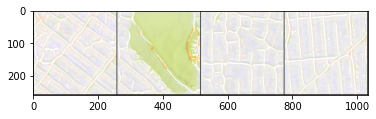

Epoch 10: Step 6000: Generator (U-Net) loss: 127.69401367187496, Discriminator loss: 0.30178279098123295


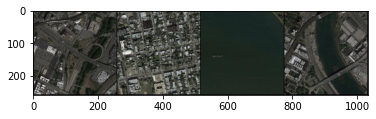

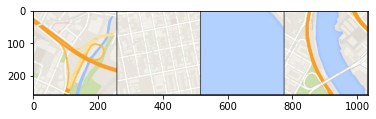

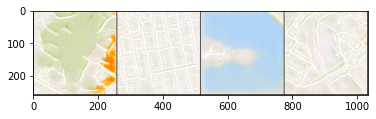

Epoch 11: Step 6200: Generator (U-Net) loss: 127.76750991821287, Discriminator loss: 0.2744769316911698


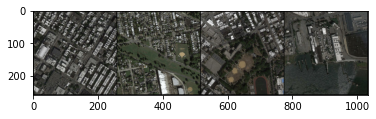

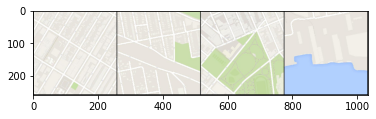

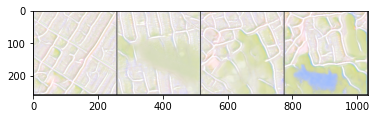

Epoch 11: Step 6400: Generator (U-Net) loss: 127.84684711456305, Discriminator loss: 0.20513156447559588


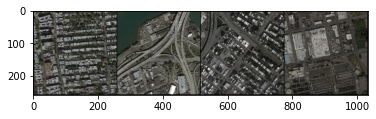

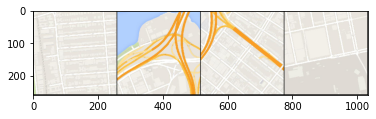

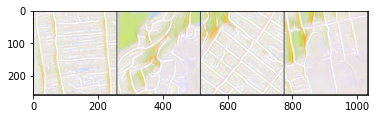

Epoch 12: Step 6600: Generator (U-Net) loss: 127.8181662368775, Discriminator loss: 0.26599608269520086


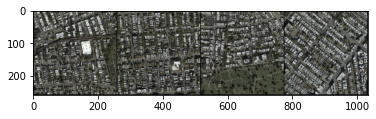

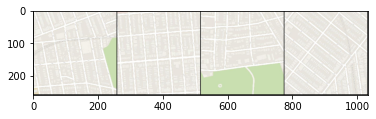

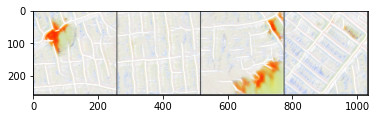

Epoch 12: Step 6800: Generator (U-Net) loss: 128.03460102081294, Discriminator loss: 0.20208355262875552


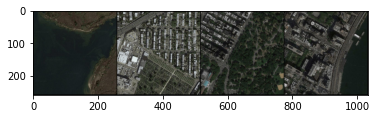

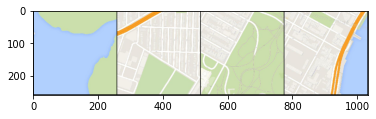

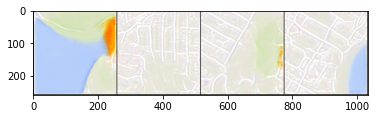

Epoch 12: Step 7000: Generator (U-Net) loss: 128.4796918869018, Discriminator loss: 0.23780445078387857


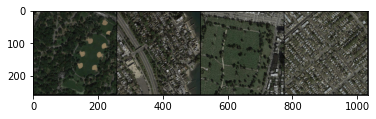

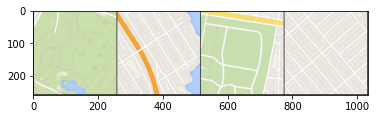

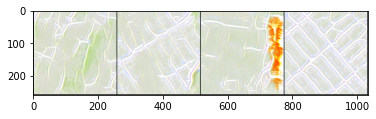

Epoch 13: Step 7200: Generator (U-Net) loss: 127.15855522155758, Discriminator loss: 0.34836217432282857


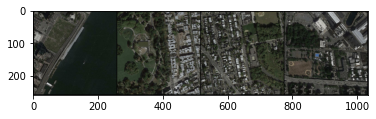

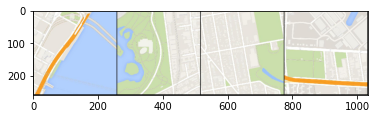

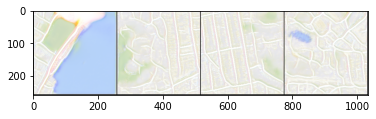

Epoch 13: Step 7400: Generator (U-Net) loss: 127.66748462677003, Discriminator loss: 0.3353525885939598


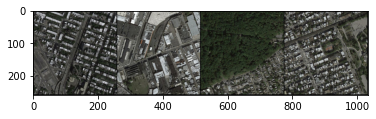

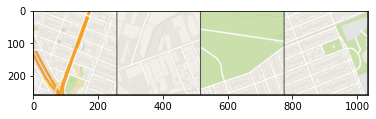

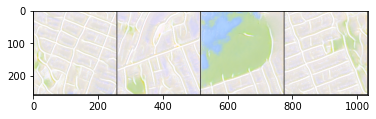

Epoch 13: Step 7600: Generator (U-Net) loss: 127.85499488830567, Discriminator loss: 0.29920978324487796


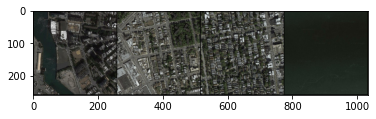

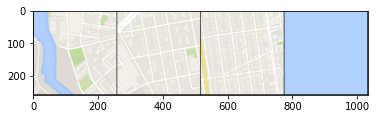

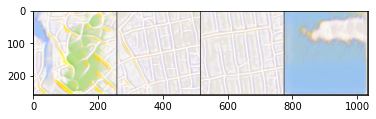

Epoch 14: Step 7800: Generator (U-Net) loss: 127.91886333465578, Discriminator loss: 0.3036469877883792


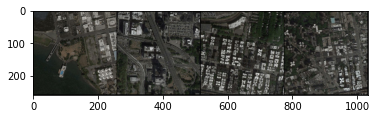

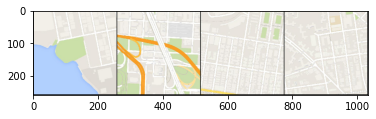

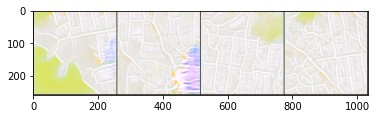

Epoch 14: Step 8000: Generator (U-Net) loss: 127.8611975097656, Discriminator loss: 0.2490609574131667


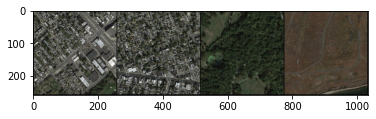

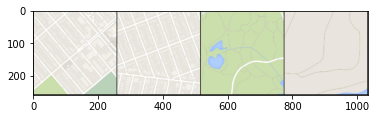

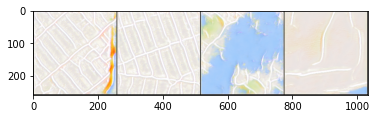

Epoch 14: Step 8200: Generator (U-Net) loss: 128.3059345245362, Discriminator loss: 0.1261732245562598


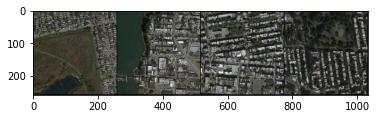

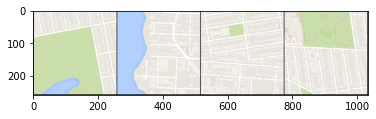

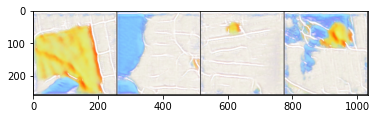

Epoch 15: Step 8400: Generator (U-Net) loss: 128.7054404449463, Discriminator loss: 0.1758581088716164


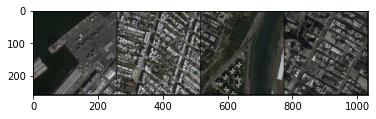

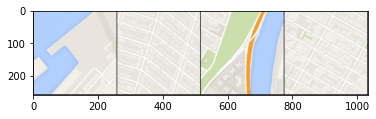

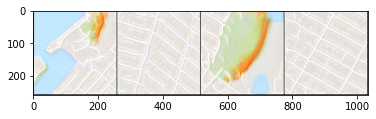

Epoch 15: Step 8600: Generator (U-Net) loss: 127.5770291900635, Discriminator loss: 0.32877311207354054


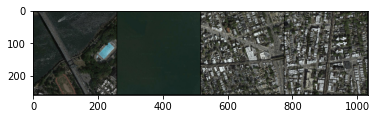

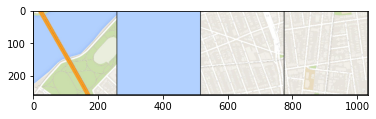

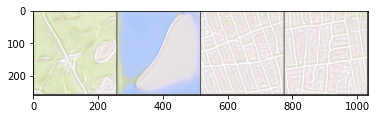

Epoch 16: Step 8800: Generator (U-Net) loss: 128.08519439697267, Discriminator loss: 0.24504693216644222


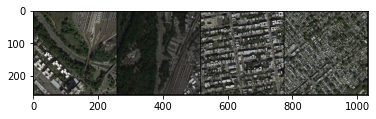

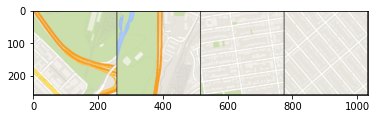

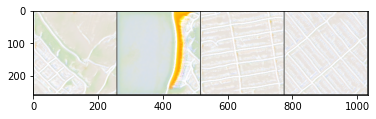

KeyboardInterrupt: ignored

In [14]:
train()